In [133]:
%config Completer.use_jedi = False
import pickle
import numpy as np
from scipy.interpolate import griddata
import pyproj as proj
import cartopy.crs as ccrs
import cartopy
import mask
from netCDF4 import Dataset
import matplotlib.pyplot as plt
from tools import lonlat_to_xy
from scipy.interpolate import interp2d
import metpy.calc as mpcalc
from metpy.units import units
from cartoplot import cartoplot
import tqdm
import matplotlib.animation as animation
from IPython import display

from regrid import regrid

/home/robbie/anaconda3/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:1598: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  shading=shading)


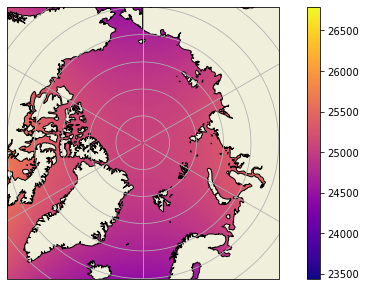

In [134]:
cartoplot(ease_lons, ease_lats, ease_dx)

In [62]:
ease_lons, ease_lats = mask.get('lon'), mask.get('lat')

my_mask = mask.get('mask')

ease_dx, ease_dy = mpcalc.lat_lon_grid_deltas(ease_lons, ease_lats)

ease_dx = abs(ease_dx); ease_dy = abs(ease_dy)

ease_cos_lons, ease_sin_lons = np.cos(np.deg2rad(ease_lons)), np.sin(np.deg2rad(ease_lons))

In [ ]:
d = Dataset('/media/robbie/TOSHIBA EXT/E5/2021.nc')
ERA_lons = np.array(d['longitude'])
ERA_lats = np.array(d['latitude'])

ERA5_lon_grid = np.array([np.array(ERA_lons), ] * 121)

ERA5_lat_grid = np.array([np.array(ERA_lats), ] * 1440).T

ERA_x_grid, ERA_y_grid = lonlat_to_xy(ERA5_lon_grid, ERA5_lat_grid,hemisphere='n')

dx, dy = mpcalc.lat_lon_grid_deltas(ERA_lons, ERA_lats)

cos_lons, sin_lons = np.cos(np.deg2rad(ERA5_lon_grid)), np.sin(np.deg2rad(ERA5_lon_grid))

In [82]:
args = proj.Proj(proj="aeqd", lat_0=90, lon_0=0, datum="WGS84", units="m")

crs_wgs = proj.Proj(init='epsg:4326')  # assuming you're using WGS84 geographic

xout, yout = proj.transform(crs_wgs, args, np.array(ease_lons),np.array(ease_lats))

xin, yin = proj.transform(crs_wgs, args, np.array(ERA5_lon_grid),np.array(ERA5_lat_grid))

/home/robbie/anaconda3/lib/python3.7/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))
/home/robbie/anaconda3/lib/python3.7/site-packages/pyproj/crs/crs.py:294: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  projstring = _prepare_from_string(" ".join((projstring, projkwargs)))
/home/robbie/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-

In [88]:
u10.ravel().shape


xin.ravel().shape

(174240,)

In [128]:
big_array = np.zeros((d['v10'].shape[0],361,361))
from scipy.interpolate import griddata

for ind in tqdm.trange(d['v10'].shape[0]):

    v10 = np.array(d['v10'][ind])
    u10 = np.array(d['u10'][ind])

    ###############################
    
#     ease_u10 = griddata((xin.ravel(),yin.ravel()),u10.ravel(),(xout,yout),method='linear')
#     ease_v10 = griddata((xin.ravel(),yin.ravel()),v10.ravel(),(xout,yout),method='linear')
    
    interpolator = LinearNDInterpolator(tri, u10.ravel())
    ease_u10 = interpolator((xout,yout))

    interpolator = LinearNDInterpolator(tri, v10.ravel())
    ease_v10 = interpolator((xout,yout))
    
    x10 = np.multiply(ease_u10,ease_cos_lons) - np.multiply(ease_v10,ease_sin_lons)
    y10 = np.multiply(ease_u10,ease_sin_lons) + np.multiply(ease_v10,ease_cos_lons)
    
    x10 = x10* units.meter / units.second
    y10 = y10* units.meter / units.second

    vort = np.array(mpcalc.vorticity(x10, y10, dx=ease_dx,dy= ease_dy))*1e6
    
    big_array[ind] = vort

100%|██████████| 368/368 [00:30<00:00, 11.95it/s]


In [ ]:
f = interp2d(ERA_x_grid,ERA_y_grid)

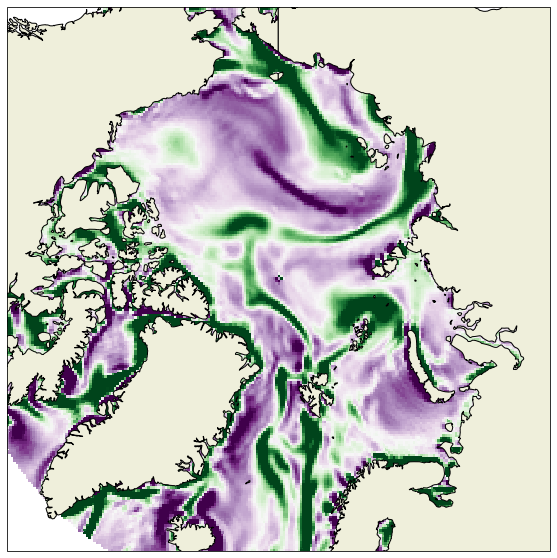

0
0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280
290
300
310
320
330
340
350
360


In [132]:
fig = plt.figure(figsize=(10,10))

ax = plt.axes(projection=ccrs.NorthPolarStereo())

ax.set_extent([-180, 180, 90, 65], ccrs.PlateCarree())    

ax.add_feature(cartopy.feature.LAND, edgecolor='black',zorder=1)

ax.margins()

bg = ax.pcolormesh(ease_lons, 
                   ease_lats, 
                   big_array[0][:-1,:-1], 
                    vmin = -50, 
                    vmax = 50,
                    transform=ccrs.PlateCarree(),
                    cmap='PRGn',
                    alpha=1)

fig.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=None, hspace=None)

########################################################

def animate(frame):
    
    if frame % 10 == 0: #Track progress
        print(frame)

    bg.set_array(big_array[frame][::-1][::-1].ravel())


#######################################################

ani = animation.FuncAnimation(fig,
                              animate,
#                              frames= range(0,comb_vort.shape[0]),                              
                             frames= range(0,big_array.shape[0]),
                             )    

video = ani.to_html5_video()
html = display.HTML(video)
display.display(html)
plt.close()

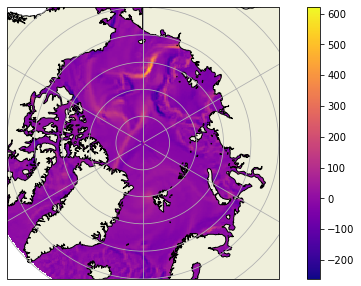

In [78]:
cartoplot(ease_lons,ease_lats,big_array[-1][::-1,::-1])

In [95]:
ds = xr.tutorial.open_dataset('rasm')

In [103]:
data = np.zeros((121,1440))

ds_ERA = xr.Dataset( data_vars={'vort_ave':(['x','y'],data)},
                        
                             coords =  {'lon':(['x','y'],ERA5_lon_grid),
                                        'lat':(['x','y'],ERA5_lat_grid)} )

data = np.zeros((361,361))

ds_EASE = xr.Dataset( data_vars={'vort_ave':(['x','y'],data)},
                        
                             coords =  {'lon':(['x','y'],ease_lons),
                                        'lat':(['x','y'],ease_lats)} )

In [ ]:
regridder = xe.Regridder(ds_ERA, ds_EASE, 'bilinear')

In [106]:
test_data = np.array(d['v10'][0])

In [ ]:
dr_out = regridder(test_data)

In [107]:
args = proj.Proj(proj="aeqd", lat_0=90, lon_0=0, datum="WGS84", units="m")
xout, yout = proj.transform(crs_wgs, args, np.array(ease_lons),np.array(ease_lats))

/home/robbie/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  This is separate from the ipykernel package so we can avoid doing imports until


In [123]:
from scipy.spatial import Delaunay
from scipy.interpolate import LinearNDInterpolator

points = np.column_stack((ERA_x_grid.ravel(),ERA_y_grid.ravel()))

tri = Delaunay(points)  # Compute the triangulation

# Perform the interpolation with the given values:
interpolator = LinearNDInterpolator(tri, test_data.ravel())
values_mesh2 = interpolator((xout,yout))

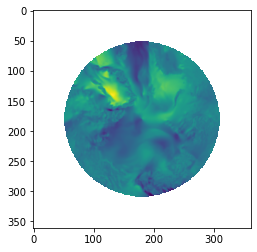

In [125]:
plt.imshow(values_mesh2)

In [126]:
values_mesh2.shape

(361, 361)

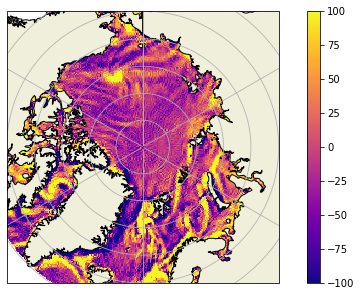

In [37]:
msl = np.array(d['msl'][0])

ease_msl = regrid(msl, ERA5_lon_grid, ERA5_lat_grid, ease_lons, ease_lats, method='linear')

ease_lapl = mpcalc.laplacian(ease_msl*1e5, deltas=(ease_dy, ease_dx))

cartoplot(ease_lons, ease_lats, ease_lapl*5e4, color_scale=(-100,100))

In [2]:
import xarray as xr
ds = xr.open_dataset('https://thredds.ucar.edu/thredds/dodsC/casestudies/'
                     'python-gallery/NAM_20161031_1200.nc').metpy.parse_cf()

AttributeError: 'Dataset' object has no attribute 'metpy'

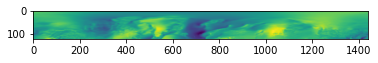

In [5]:
plt.imshow(v10)

In [11]:
args = proj.Proj(proj="aeqd", lat_0=90, lon_0=0, datum="WGS84", units="m")

crs_wgs = proj.Proj(init='epsg:4326')  # assuming you're using WGS84 geographic

xin, yin = proj.transform(crs_wgs, args, np.array(ERA_lons),np.array(ERA_lats))

/home/robbie/anaconda3/lib/python3.7/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))
/home/robbie/anaconda3/lib/python3.7/site-packages/pyproj/crs/crs.py:294: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  projstring = _prepare_from_string(" ".join((projstring, projkwargs)))
/home/robbie/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-

ProjError: x, y, z, and time must be same size

In [9]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import metpy.calc as mpcalc
from metpy.units import units
import numpy as np
import xarray as xr

In [20]:
def earth_relative_wind_components(ugrd, vgrd):
    """Calculate the north-relative components of the wind from the grid-relative
    components using Cartopy transform_vectors.

    Parameters
    ----------
        ugrd : Xarray DataArray (M, N)
            grid relative u-component of the wind
        vgrd : Xarray DataArray (M, N)
            grid relative v-component of the wind

    Returns
    -------
        unr, vnr : tuple of array-like Quantity
            The north-relative wind components in the X (East-West) and Y (North-South)
            directions, respectively.
    """
#     if 'crs' not in list(ugrd.coords):
#         raise ValueError('No CRS in coordinate, be sure to use the MetPy accessor parse_cf()')

    data_crs = ds['u-component_of_wind_isobaric'].metpy.cartopy_crs


    x = ugrd.x.values
    y = ugrd.y.values

    xx, yy = np.meshgrid(x, y)

    ut, vt = ccrs.PlateCarree().transform_vectors(data_crs, xx, yy, ugrd.values, vgrd.values)

    uer = ut * units(ugrd.units)
    ver = vt * units(vgrd.units)

    return uer, ver

In [21]:
ds = xr.open_dataset('https://thredds.ucar.edu/thredds/dodsC/casestudies/'
                     'python-gallery/NAM_20161031_1200.nc').metpy.parse_cf()

ds

<xarray.Dataset>
Dimensions:                                    (height_above_ground: 1, height_above_ground1: 2, height_above_ground3: 2, isobaric: 39, time: 1, x: 614, y: 428)
Coordinates:
  * time                                       (time) datetime64[ns] 2016-10-...
  * isobaric                                   (isobaric) float32 50.0 ... 10...
  * y                                          (y) float32 -832207.3 ... 4373...
  * x                                          (x) float32 -4223613.0 ... 324...
    metpy_crs                                  object Projection: lambert_con...
  * height_above_ground1                       (height_above_ground1) float32 ...
  * height_above_ground                        (height_above_ground) float32 2.0
  * height_above_ground3                       (height_above_ground3) float32 ...
Data variables:
    LambertConformal_Projection                int32 0
    Temperature_isobaric                       (time, isobaric, y, x) float32 ...
    lat                                        (y, x) float64 ...
    lon                                        (y, x) float64 -133.5 ... -49.34
    Temperature_height_above_ground            (time, height_above_ground1, y, x) float32 ...
    Relative_humidity_isobaric                 (time, isobaric, y, x) float32 ...
    Dew_point_temperature_height_above_ground  (time, height_above_ground, y, x) float32 ...
    u-component_of_wind_isobaric               (time, isobaric, y, x) float32 ...
    v-component_of_wind_height_above_ground    (time, height_above_ground3, y, x) float32 ...
    u-component_of_wind_height_above_ground    (time, height_above_ground3, y, x) float32 ...
    Geopotential_height_isobaric               (time, isobaric, y, x) float32 ...
    v-component_of_wind_isobaric               (time, isobaric, y, x) float32 ...

In [31]:
# Grab lat/lon values (NAM will be 2D)
lats = ds.lat.data
lons = ds.lon.data

# Grab x, y data and make 2D for wind component plotting because
# u- and v-components are grid relative
x = ds['u-component_of_wind_isobaric'].x
y = ds['u-component_of_wind_isobaric'].y

xx, yy = np.meshgrid(x, y)

# Grab Cartopy CRS from metadata for plotting wind barbs
datacrs = ds['u-component_of_wind_isobaric'].metpy.cartopy_crs

print(datacrs)

# Select and grab 500-hPa geopotential heights and smooth with n-point smoother
level = 1000 * units.hPa
hght_500 = mpcalc.smooth_n_point(ds.Geopotential_height_isobaric.metpy.sel(
    vertical=level).squeeze(), 9, 50)

# Select and grab 500-hPa wind components
uwnd_500 = ds['u-component_of_wind_isobaric'].metpy.sel(vertical=level).squeeze()
vwnd_500 = ds['v-component_of_wind_isobaric'].metpy.sel(vertical=level).squeeze()

# Compute north-relative wind components for plotting purposes
uwnd_er, vwnd_er = earth_relative_wind_components(uwnd_500, vwnd_500)

# Create a clean datetime object for plotting based on time of Geopotential heights
vtime = ds.time.data[0].astype('datetime64[ms]').astype('O')

In [32]:
dx, dy = mpcalc.lat_lon_grid_deltas(lons, lats)

# Calculate absolute vorticity from MetPy function
avor_500 = mpcalc.vorticity(uwnd_er, vwnd_er, dx=dx,dy=dy)


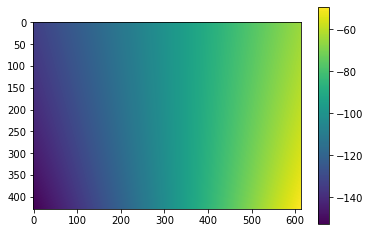

In [36]:
plt.imshow(lons)
plt.colorbar()

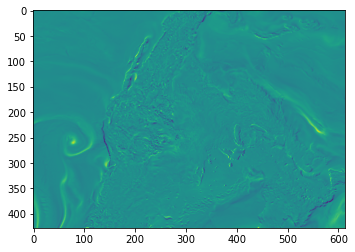

In [33]:
plt.imshow(avor_500)